# Exercice: Credit Client 
### Projet final de Machine Learning
#### Professeure: Ana Karina Fermin Rodriguez
#### Projet réalisé par: Jovana Krstevska

<br>

*NB: Ce notebook est fait en **Python 3.8.3**. Si votre version n'est pas celle-là certaines fonctonnalités peuvent ne pas fonctionner correctement.*

In [1]:
!python --version

Python 3.8.3


### Introduction

<br>

Dans ce notebook on va essayer de traiter les données des clients d'une banque (ou demandeurs de crédit d'une banque plutôt) avec des outils de Maching Learning, et plus précisément d'apprentissage supervisé. 

<br>

### Apprentissage supervisé 

<br>

C'est un apprentissage où les vraies valeurs de la cible nous sont déjà connues. Alors, nos algorithmes sont comme des enfants, ils apprennent d'une partie des données, on valide leur connaissance sur des observations similairas mais pas vues pendant l'apprentissage et ensuite on teste leur performance sur des observations nouvelles. S'ils ont bien appris, mais pas tout appris par coeur sans comprendre (cf. *overfitting*) on aura des prédictions assez satisfaisantes pour notre cible. 

<br>

Les deux grandes classes de l'apprentissage supervisé sont:

    Classification - cible discrète, en classes
    Regression - cible continue

Cet exercice est un exercice de **classification**.
Nous avons des observations qui sont DEFAULT et d'autres qui ne le sont pas, donc il s'agit d'une classification *binaire*.

<br>

Commençons par importer les modules nécessaires pour les tout premières étapes. 

In [2]:
# Modules nécessaires

# Essentiels pour le traitement des données
import numpy as np
import pandas as pd
from math import *
from datetime import datetime as dt

# Affichage
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from ipywidgets import widgets
from IPython.display import display
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
pd.options.plotting.backend = "plotly"

# Fixer la graine
np.random.seed(7)

In [3]:
# Ma palette des couleurs
palette = ['#c95c54', '#00bfdc', '#f7ca28', '#39d4a0', '#9c82c7', '#fa9b4d',
          '#c95c54', '#00bfdc', '#f7ca28', '#39d4a0', '#9c82c7', '#fa9b4d']

In [4]:
# Fonction pour affichage en pour cent
def to_percent(df):
    return df.apply(lambda x: str(round(x*100,2)) + '%')

### Importation des données

<br>

On lis les données de la base et on affiche des informations importantes sur son contenu.

In [5]:
# Importation des données brutes
df = pd.read_excel("Credit_Cleaned.xlsx")

In [6]:
# Informations sur le dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5380 entries, 0 to 5379
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Y                    5380 non-null   object        
 1   Customer_Type        5380 non-null   object        
 2   BirthDate            5380 non-null   datetime64[ns]
 3   Customer_Open_Date   5380 non-null   datetime64[ns]
 4   P_Client             5380 non-null   object        
 5   Educational_Level    5380 non-null   object        
 6   Marital_Status       5380 non-null   object        
 7   Number_Of_Dependant  5380 non-null   int64         
 8   Years_At_Residence   5380 non-null   int64         
 9   Net_Annual_Income    5380 non-null   float64       
 10  Years_At_Business    5380 non-null   int64         
 11  Prod_Sub_Category    5380 non-null   object        
 12  Prod_Decision_Date   5380 non-null   datetime64[ns]
 13  Source               5380 non-nul

In [7]:
# Petit apperçu
df.head()

,Y,Customer_Type,BirthDate,Customer_Open_Date,P_Client,Educational_Level,Marital_Status,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Prod_Sub_Category,Prod_Decision_Date,Source,Type_Of_Residence,Nb_Of_Products,Prod_Closed_Date,Prod_Category,Prod_Closed_Date_NA
0,NO_DEFAULT,Non Existing Client,1977-08-07,2012-02-13,NP_Client,University,Married,3,1,36.0,1,C,2012-02-14,Sales,Owned,1,2013-06-02,B,True
1,NO_DEFAULT,Existing Client,1974-06-13,2009-02-04,P_Client,University,Married,0,12,18.0,2,C,2011-06-30,Sales,Parents,1,2013-06-02,G,True
2,NO_DEFAULT,Non Existing Client,1973-11-07,2012-04-03,NP_Client,University,Married,2,10,36.0,1,C,2012-04-04,Sales,Owned,1,2013-06-02,B,True
3,DEFAULT,Existing Client,1982-07-08,2011-08-25,NP_Client,University,Married,3,3,36.0,1,C,2011-09-07,Sales,New rent,1,2012-12-31,L,False
4,NO_DEFAULT,Non Existing Client,1953-08-18,2012-01-10,NP_Client,University,Married,2,1,36.0,1,C,2012-01-11,Sales,Owned,1,2013-06-02,D,True


Nous avons 18 **variables explicatives** et 1 **variable cible**. 

Variables categorielles:

* Customer_Type
* P_Client
* Educational_Level
* Marital_Status
* Number_Of_Dependent
* Prod_Sub_Category
* Source
* Type_Of_Residence
* Nb_Of_Products
* Prod_Category
* Prod_Closed_Date_NA

<br>
Les variables qui contiennent des dates:

* BirthDate
* Customer_Open_Date
* Prod_Decision_Date
* Prod_Closed_Date

<br>
Discrètes:

* Years_At_Business
* Years_At_Residence
* Net_Annual_Income

On vérifie s'il y a des données non-renseignées. Puisqu'on a la version nettoyée de ces données, on s'attend à ce qu'il n'y ait pas de données nulles, ce qui est bien le cas:

In [8]:
# Potentielles valeurs Null
df.isnull().sum()

Y                      0
Customer_Type          0
BirthDate              0
Customer_Open_Date     0
P_Client               0
Educational_Level      0
Marital_Status         0
Number_Of_Dependant    0
Years_At_Residence     0
Net_Annual_Income      0
Years_At_Business      0
Prod_Sub_Category      0
Prod_Decision_Date     0
Source                 0
Type_Of_Residence      0
Nb_Of_Products         0
Prod_Closed_Date       0
Prod_Category          0
Prod_Closed_Date_NA    0
dtype: int64

Ensuite, sauvegardons les variables categorielles à part:

In [9]:
categorical_features = ['Customer_Type', 'P_Client', 'Source',
                        'Nb_Of_Products', 'Prod_Sub_Category',
                        'Educational_Level', 'Marital_Status',
                        'Type_Of_Residence', 'Number_Of_Dependant',
                        'Prod_Category', 'Prod_Closed_Date_NA']

descrete_features = ['BirthDate', 'Customer_Open_Date', 'Years_At_Residence',
                     'Net_Annual_Income', 'Years_At_Business', 'Prod_Decision_Date',
                    'Prod_Closed_Date']

In [10]:
print(f"Nombre de variables categorielles: {len(categorical_features)}")
print(f"Nombre de variables discrètes: {len(descrete_features)}")
print(f"Au total: {len(categorical_features) + len(descrete_features)} variables explicatives.")

Nombre de variables categorielles: 11
Nombre de variables discrètes: 7
Au total: 18 variables explicatives.


Ces variables doivent être encodées afin qu'on puisse commencer à tester des différents modèles. 

Commençons par encoder la cible afin de pouvoir étudier les liens entre elle et les autres variables. 

Dans toutes les observations où la valeur de Y est NO_DEFAULT on mettra 0, et là où il y a DEFAULT on mettra 1.

In [11]:
# Encodage de la cible
print(f"Classes avant encodage:\n{df['Y'].value_counts()}\n")
df['Y'].replace({"NO_DEFAULT" : 0, "DEFAULT" : 1}, inplace = True)
print(f"Classes après encodage:\n{df['Y'].value_counts()}")

Classes avant encodage:
NO_DEFAULT    4987
DEFAULT        393
Name: Y, dtype: int64

Classes après encodage:
0    4987
1     393
Name: Y, dtype: int64


In [12]:
# Highly skewed data
to_percent(df['Y'].value_counts() / df['Y'].count())

0    92.7%
1     7.3%
Name: Y, dtype: object

On remarque que la cible est assez biaisée (*skewed* en anglais). C'est-à-dire, on a beaucoup plus d'exemples de NO_DEFAULT que de DEFAULT. Plus précisément, environ 92,7% de NO_DEFAULT et 7.3% de DEFAULT. 


Donc, si on prédit 0 pour toute observation d'un ensemble test, on aura une justesse (*accuracy*) très élevée, mais la précision réelle de l'algorithme sera basse, car on ne va jamais obtenir les prédictions importantes, là où il y a un défault, donc les prédictions de la classe 1.

Ceci va jouer un rôle essentiel dans la définition du modèle qu'on va appliquer à ce jeu de données afin d'obtenir un modèle d'une précision satisfaisante.

## Analyse et modifications des variables


<br>

D'abord on crée des fonctions qui nous aideront à mieux analyser les variables explicatives (features) et la cible (target). 

<br>

Commençons par une fonction qui affiche les histogrammes des variables données en argument. On a la possibilité d'indiquer si les variables qu'on veut afficher sont categorielles ou pas grâce au booléan **categorical**, et aussi un booléan **percent** qui sert à indiquer si on veut voir les pourcentages que les groupes représentent de toutes les observations. L'argument **nb_cols** sert à indiquer le nombre de colonnes de l'affichage de tous ces graphiques, à modifier selon les préférances de l'utilisateur. 

In [13]:
def plot_features(features, categorical = True, percent = False, nb_cols = 3):
    nb_features = len(features)
    histnorm_ = ''
    if percent: histnorm = 'percent'
    # Make subplots        
    fig = make_subplots(rows=int(np.ceil(nb_features/nb_cols)), cols=nb_cols,
                       subplot_titles = features)

    for i in range(nb_features):
        classes = df[features[i]].value_counts()
        classes.sort_values(ascending = False, inplace = True)
        nb_classes = classes.shape[0]
        
        if nb_classes < 20:
            # Counts if categorical feature
            fig.add_trace(go.Histogram(x = df[features[i]],
                                       histnorm = histnorm_,
                                       marker_color = palette,
                                       showlegend = False),
                          row = int(np.floor(i/nb_cols)) + 1, col = i%nb_cols + 1)
        else:
            # Normal histogram if descrete/continuous feature
            fig.add_trace(go.Histogram(x = df[features[i]],
                                      histnorm = histnorm_,
                                      marker_color = palette[4],
                                      showlegend = False),
                          row = int(np.floor(i/nb_cols)) + 1, col = i%nb_cols + 1)
            
    fig.update_layout(width = 800, height = 800*nb_features/(nb_cols*3))
    fig.show()

Affichons donc, toutes les variables, la cible y incluse, pour avoir un premier apperçu de leurs distributions.

In [14]:
plot_features(df.columns,nb_cols = 3)

Ensuite, on créé une fonction qui nous permet d'afficher l'histogramme d'une variable categorielle à gauche et le pourcentage des observations avec Y=0 et Y=1 selon la catégorie dans laquelle elles se trouvent.

In [15]:
def plot_target_vs_categorical_feature(feature):
    
    classes = df[feature].value_counts()
    classes.sort_values(ascending = False, inplace = True)
    nb_classes = classes.shape[0]
    
    tmp = df.groupby([feature])['Y'].mean()
    
    fig = make_subplots(rows=1, cols=2,
                       subplot_titles=(f"Client count per {feature}", 
                                       "DEFAULT (Y=1) vs. NO_DEFAULT (Y=0) "))
    
    # Count
    fig.add_trace(go.Histogram(x = df[feature],
                        marker_color = palette,
                              showlegend = False),
                  row=1, col=1)
    # Percentage of target = 1
    fig.add_trace(go.Histogram(x = df[feature],
                              y = df['Y'],
                              histfunc = 'avg',
                        #      histnorm = 'percent',
                              name = "Y = 1",
                              marker_color = palette[0]),
                 row = 1, col=2)
    fig.add_trace(go.Histogram(x = df[feature],
                              y = 1 - df['Y'],
                              histfunc = 'avg',
                        #      histnorm = 'percent',
                              name = 'Y = 0',
                              marker_color = palette[1]),
                 row = 1, col=2)
    #fig.update_layout(showlegend = False)
    fig.update_layout(barmode = 'stack')
    fig.update_layout(width = 800, height = 500)
    #fig.update_xaxes(categoryorder = 'total descending')
    fig.show()

Affichons les 11 variables categorielles et la répartition des valeurs de la cible en fonction des catégories pour chaque variable categorielle.

In [16]:
for feature in categorical_features:
    plot_target_vs_categorical_feature(feature)

On dispose de vriament très peu d'observations de DEFAULT. Il semble que le fait d'être un locataire récent (*New_Rent*) influe sur le fait que Y soit DEFAULT. La même remarque peut être faite pour la **Prod_Category** *L* et pour **Prod_Closed_Date_NA** = *False*.

<br>

On continue avec les variables discrètes restantes. 

In [17]:
# Years_At_Residence 
fig = go.Figure()
fig.add_trace(go.Histogram(x = df['Years_At_Residence'],
                          marker_color = palette[0]))
fig.update_layout(title = "Years_At_Residence")
fig.show()

On doit essayer d'avoir le plus de variables qui ressemblent plutôt à des gaussiennes pour que les modèles (en particulier les modèles linéaires) soient performants. 
Je décide donc, de modifier cette variable afin d'étaler son histogramme. Je lui applique une transformation avec la fonction racine carrée:

In [18]:
# sqrt(Years_At_Residence)
fig = go.Figure()
fig.add_trace(go.Histogram(x = df['Years_At_Residence'].apply(lambda x: sqrt(x)),
                          marker_color = palette[6]))
fig.update_layout(title = "Racine carrée de Years_At_Residence")
fig.show()

On voit que les valeurs sont un peu plus centrées et distribuée d'une façon plus *normale*. Je décide donc de garder cette transformation.

In [19]:
df['Years_At_Residence'] = df['Years_At_Residence'].apply(lambda x: sqrt(x))

In [20]:
# Years_At_Business
fig = go.Figure()
fig.add_trace(go.Histogram(x = df['Years_At_Business'],
                          marker_color = palette[0]))
fig.update_layout(title = "Years_At_Business")

Cette variable est très déviée également, alors j'applique une transformation racine carrée double. Voici ce que l'on obtient: 

In [21]:
# sqrt(sqrt(Years_At_Business))
fig = go.Figure()
fig.add_trace(go.Histogram(x = df['Years_At_Business'].apply(lambda x: sqrt(sqrt(x))),
                          marker_color = palette[0]))
fig.update_layout(title = "Years_At_Business")

On la garde également.

In [22]:
df['Years_At_Business'] = df['Years_At_Business'].apply(lambda x: sqrt(sqrt(x)))

In [23]:
# Net Annual Income
fig = go.Figure()
fig.add_trace(go.Histogram(x = df['Net_Annual_Income'],
             marker_color = palette[0]))

Cette variable est extrêmement déviée, très probablement parce qu'il y a très peu de gens qui ont des gros salaires, comparé au nombre de gens qui sont pauvres, ou payés correctement.

Alors je la modifie en lui appliquant une transformation log.

In [24]:
# log(Net Annual Income)
fig = go.Figure()
fig.add_trace(go.Histogram(x = df['Net_Annual_Income'].apply(lambda x: log(x,10)),
             marker_color = palette[0]))

On décide donc, de prendre plutôt le logarithme en base 10 du salaire net annuel pour nos modèles éventuels.

In [25]:
df['Net_Annual_Income'] = df['Net_Annual_Income'].apply(lambda x: log(x,10))

###  Variables en forme de Dates

In [26]:
plot_features(['BirthDate', 
               'Customer_Open_Date',
               'Prod_Decision_Date',
               'Prod_Closed_Date'], nb_cols=1)

Créons une nouvelle variable qui va s'appeler **duration** qui contiendra la période entre **Prod_Closed_Date** et **Customer_Open_Date**. Ainsi, on espère se libérer des données très déviées tout en gardant l'information importante qu'elles portent. 

In [27]:
duration = df['Prod_Closed_Date'] - df['Customer_Open_Date']
duration = duration.dt.days
duration.name = 'days'

Regardons son histogramme:

In [28]:
fig = go.Figure()
fig.add_trace(go.Histogram(x = duration,
                           marker_color = palette[0],
                           showlegend = False))

On remarque qu'elle est assez déviée, alors on applique une transformation log.

In [29]:
fig = go.Figure()
fig.add_trace(go.Histogram(x = duration.apply(lambda x: log(x,10)),
                           marker_color = palette[0],
                           showlegend = False))

On décide d'enlever les variables **Customer_Open_Date** et **Prod_Decision_Date** et remplacer l'information qu'elles apportent par leur différence, une durée, plus précisément on prend le logarithme en base 10 de ces durées pour que ça ressebmle le plus à une loi gaussienne. 

In [30]:
duration = duration.apply(lambda x: log(x,10))
df.drop(columns = ['Customer_Open_Date', 'Prod_Closed_Date'], inplace = True)
df['prod_duration'] = duration

Créons une fonction qui nous permet de convertir les données de format *datetime* en un format ordinal.

In [31]:
def convert_datetime_featues_to_ordinals(df, features):
    for feature in features:
        tmp = df[feature].apply(lambda x: x.toordinal())
        tmp = (tmp - tmp.mean()) / tmp.std()
        df[feature] = tmp.values

In [32]:
convert_datetime_featues_to_ordinals(df, ['BirthDate', 'Prod_Decision_Date'])

In [33]:
df.columns

Index(['Y', 'Customer_Type', 'BirthDate', 'P_Client', 'Educational_Level',
       'Marital_Status', 'Number_Of_Dependant', 'Years_At_Residence',
       'Net_Annual_Income', 'Years_At_Business', 'Prod_Sub_Category',
       'Prod_Decision_Date', 'Source', 'Type_Of_Residence', 'Nb_Of_Products',
       'Prod_Category', 'Prod_Closed_Date_NA', 'prod_duration'],
      dtype='object')

Voici un petit aperçu de notre data set à présent:

In [34]:
df.head()

,Y,Customer_Type,BirthDate,P_Client,Educational_Level,Marital_Status,Number_Of_Dependant,Years_At_Residence,Net_Annual_Income,Years_At_Business,Prod_Sub_Category,Prod_Decision_Date,Source,Type_Of_Residence,Nb_Of_Products,Prod_Category,Prod_Closed_Date_NA,prod_duration
0,0,Non Existing Client,0.487284,NP_Client,University,Married,3,1.000000,1.556303,1.000000,C,0.952958,Sales,Owned,1,B,True,2.676694
1,0,Existing Client,0.199752,P_Client,University,Married,0,3.464102,1.255273,1.189207,C,-1.309120,Sales,Parents,1,G,True,3.198382
2,0,Non Existing Client,0.145293,NP_Client,University,Married,2,3.162278,1.556303,1.000000,C,1.446862,Sales,Owned,1,B,True,2.628389
3,1,Existing Client,0.935943,NP_Client,University,Married,3,1.732051,1.556303,1.000000,C,-0.627533,Sales,New rent,1,L,False,2.693727
4,0,Non Existing Client,-1.699804,NP_Client,University,Married,2,1.000000,1.556303,1.000000,C,0.617104,Sales,Owned,1,D,True,2.706718


## Encodage des variables categorielles

<br>

Pour cela, on va encoder les variables **Customer_Type** et **Prod_Closed_Date** à valeurs dans {0,1} et on va utiliser la méthode *OneHotEncoding* là où c'est nécessaire. 

Classes pour lesquelles il faudrait encoder les données: 

Variables à 2 classes:

* Y
* Customer_Type
* P_client
* Source
* Prod_Closed_Date 

Variables à 3 classes:

* Nb_Of_Products
* Prod_Sub_Category

Variables à 4 ou plus classes:

* Educational_Level (4)
* Marital_Status (5)
* Type_Of_Residence (5)
* Number_Of_Dependant (10)
* Prod_Category (13)

In [35]:
# Nombre de classes pour les variables categorielles
for column in df.columns:
    classes = df[column].value_counts()
    if classes.count() < 20:
        print(f"Variable: {column}\nNombre de classes: {classes.count()}\nClasses:\n{classes}\n\n")

Variable: Y
Nombre de classes: 2
Classes:
0    4987
1     393
Name: Y, dtype: int64


Variable: Customer_Type
Nombre de classes: 2
Classes:
Non Existing Client    3369
Existing Client        2011
Name: Customer_Type, dtype: int64


Variable: P_Client
Nombre de classes: 2
Classes:
NP_Client    4968
P_Client      412
Name: P_Client, dtype: int64


Variable: Educational_Level
Nombre de classes: 4
Classes:
University           4785
Master/PhD            522
Diploma                58
Secondary or Less      15
Name: Educational_Level, dtype: int64


Variable: Marital_Status
Nombre de classes: 5
Classes:
Married      4206
Single       1046
Widowed        64
Divorced       63
Separated       1
Name: Marital_Status, dtype: int64


Variable: Number_Of_Dependant
Nombre de classes: 10
Classes:
0     2891
2     1135
3      622
1      485
4      201
5       32
6        8
7        4
20       1
12       1
Name: Number_Of_Dependant, dtype: int64


Variable: Prod_Sub_Category
Nombre de classes: 3
Classe

In [36]:
# Encodage de Customer_Type
print(f"Classes avant encodage:\n{df['Customer_Type'].value_counts()}\n")
df['Customer_Type'].replace({"Non Existing Client" : 0, "Existing Client" : 1}, inplace = True)
print(f"Classes après encodage:\n{df['Customer_Type'].value_counts()}")

Classes avant encodage:
Non Existing Client    3369
Existing Client        2011
Name: Customer_Type, dtype: int64

Classes après encodage:
0    3369
1    2011
Name: Customer_Type, dtype: int64


In [37]:
# Encodage de P_Client
print(f"Classes avant encodage:\n{df['P_Client'].value_counts()}\n")
df['P_Client'].replace({'NP_Client' : 0, 'P_Client' : 1}, inplace = True)
print(f"Classes après encodage:\n{df['P_Client'].value_counts()}")

Classes avant encodage:
NP_Client    4968
P_Client      412
Name: P_Client, dtype: int64

Classes après encodage:
0    4968
1     412
Name: P_Client, dtype: int64


In [38]:
# Encodage de Prod_Closed_Date_NA
print(f"Classes avant encodage:\n{df['Prod_Closed_Date_NA'].value_counts()}\n")
df["Prod_Closed_Date_NA"].replace({True : 1, False : 0}, inplace = True)
print(f"Classes après encodage:\n{df['Prod_Closed_Date_NA'].value_counts()}")

Classes avant encodage:
True     4206
False    1174
Name: Prod_Closed_Date_NA, dtype: int64

Classes après encodage:
1    4206
0    1174
Name: Prod_Closed_Date_NA, dtype: int64


In [39]:
# Encodage de Source
print(f"Classes avant encodage:\n{df['Source'].value_counts()}\n")
df["Source"].replace({'Sales' : 1, 'Branch' : 0}, inplace = True)
print(f"Classes après encodage:\n{df['Source'].value_counts()}")

Classes avant encodage:
Sales     4119
Branch    1261
Name: Source, dtype: int64

Classes après encodage:
1    4119
0    1261
Name: Source, dtype: int64


Il nous reste à encoder les variables categorielles restantes, à savoir:

* Educational_Level
* Marital_Status
* Prod_Sub_Category
* Type_Of_Residence
* Prod_Category

In [40]:
def OneHotEncoding_(df, features):
    for feature in features:
        tmp = pd.get_dummies(df[feature])
        for column in tmp.columns:
            df[column] = tmp[column].values
    df.drop(columns = features, inplace = True)

In [41]:
features = ['Educational_Level', 'Marital_Status', 'Prod_Sub_Category',
            'Type_Of_Residence', 'Prod_Category']
OneHotEncoding_(df, features)

Une fois nos variables bien choisies, modifiées et encodées, on peut procéder à l'étape suivante et choisir le modèle de prédiction qui conviendrait le mieux.

In [42]:
df.columns

Index(['Y', 'Customer_Type', 'BirthDate', 'P_Client', 'Number_Of_Dependant',
       'Years_At_Residence', 'Net_Annual_Income', 'Years_At_Business',
       'Prod_Decision_Date', 'Source', 'Nb_Of_Products', 'Prod_Closed_Date_NA',
       'prod_duration', 'Diploma', 'Master/PhD', 'Secondary or Less',
       'University', 'Divorced', 'Married', 'Separated', 'Single', 'Widowed',
       'C', 'G', 'P', 'Company', 'New rent', 'Old rent', 'Owned', 'Parents',
       'A', 'B', 'D', 'E', 'F', 'H', 'I', 'J', 'K', 'L', 'M'],
      dtype='object')

In [43]:
df.dtypes

Y                        int64
Customer_Type            int64
BirthDate              float64
P_Client                 int64
Number_Of_Dependant      int64
Years_At_Residence     float64
Net_Annual_Income      float64
Years_At_Business      float64
Prod_Decision_Date     float64
Source                   int64
Nb_Of_Products           int64
Prod_Closed_Date_NA      int64
prod_duration          float64
Diploma                  uint8
Master/PhD               uint8
Secondary or Less        uint8
University               uint8
Divorced                 uint8
Married                  uint8
Separated                uint8
Single                   uint8
Widowed                  uint8
C                        uint8
G                        uint8
P                        uint8
Company                  uint8
New rent                 uint8
Old rent                 uint8
Owned                    uint8
Parents                  uint8
A                        uint8
B                        uint8
D       

## Corrélation entre les variables

<br>

On vérifie les corrélations entre les variables et la cible: 

In [44]:
corr = df.corr()
px.imshow(corr, color_continuous_scale = 'viridis')

On remarque que la plupart des variables ne sont pas fortement correlées entre elles. 
Les exceptions sont: 

* **Master/PhD** et **University** corrélées à -0.93
* **Married** et **Single** corrélées à -0.93 
* **E** et **P** corrélées à 0.895
* **prod_duration** et **Customer_Type** à 0.65

Je décide de supprimer les variables **Master/PhD**, **Married** et **P** pour cette raison et de continuer à travailler avec le reste des variables.

In [45]:
df.drop(columns = ['P', 'Master/PhD', 'Married'], inplace = True)

## Analayse en composantes principales (ACP)

<br>

Même si l'analyse en composantes principales a été conçue pour les variables *continues*, afin de réduire la dimensionnalité des variables explicatives, ici on l'utilise simplement d'un le cadre d'une visualisation de l'information contenue dans notre dataset. 

<br>

C'est-à-dire, on va effectuer une ACP en 2 dimensions, et puis en 3 pour voir si on peut dissocier les clusters NO_DEFAULT{Y=0} et DEFAULT{Y=1} visuellement. Cela pourrait nous donner une idée sur comment ces valeurs sont distribuées dans toute la data set et nous aider dans le choix des variables à choisir pour les modèles.

In [46]:
features = df.columns.drop('Y')

In [47]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(df[features])
total_var = pca.explained_variance_ratio_.sum()*100

fig = px.scatter(components, x=0, y=1, color=df['Y'],
                title=f'Total Explained Variance: {total_var:.2f}%',)
fig.show()

In [48]:
pca = PCA(n_components=3)
components = pca.fit_transform(df[features])

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=df['Y'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

L'ensemble {Y=1} semble être distribué d'une façon quasiment uniforme. Cela veut dire qu'il serait difficile de faire un modèle qui prédira les données avec une bonne précision sur la probabilité de prédire 1 là où la vraie valeur est en effet 1, et c'est cela qu'on priorise dans ce cas-là. Cependant, en prenant toutes les variables dont on dispose, on pourrait arriver à avoir de résultats satisfaisant. Procédons aux modèles.

# Modèles d'Apprentissage Supervisé

Tout d'abord, séparons notre *dataset* en *features* (X) et *target* (y)

*Remarque: Je prends des copies car la dataframe est un objet mutable en python, donc il se comporte comme un passage par référence dans un langage compilé. Puisque je ne veux pas modifier la dataframe initiale, je prends des copies.* 

In [49]:
X = df.drop(columns = ['Y']).copy()
y = df['Y'].copy()

Ensuite, on va partager notre *dataset* en trois parties, une sur laquellue on va entraîner (X_train), une qui va nous servir pour la cross-validation (X_test) et une troisième qui va nous servir pour tester les derniers résultats (X_new_data). On va également standardiser les *features* pour nous assurer que les algorithmes de descente de gradient optimisés (qui se cachent derrière presque tous les modèles de machine learning) puissent converger. 

Pour cela, on va se servir d'une utilité du module **sklearn**:

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.45, random_state = 7)
X_test, X_new_data, y_test, y_new_data = train_test_split(X_test, y_test, test_size=0.25,
                                                         random_state = 7)

sc = StandardScaler()
sc.fit(X_train)
X_train = sc.transform(X_train)
X_test = sc.transform(X_test)
X_new_data = sc.transform(X_new_data)

# Pour faire de la cross-validations stratifiée
X_crossval =  np.concatenate((X_train, X_test), axis = 0)
y_crossval = np.concatenate((y_train, y_test), axis = 0)

On s'assure que les observations où Y=1 sont assez représentées dans les ensembles qu'on a obtenu: 

In [51]:
print(f"Dans X_train: {(y_train.sum() / y_train.shape[0])*100:.3f}% de Y=1")

Dans X_train: 7.334% de Y=1


In [52]:
print(f"Dans X_test: {(y_test.sum() / y_test.shape[0])*100:.3f}% de Y=1")

Dans X_test: 7.218% de Y=1


In [53]:
print(f"Dans X_new_data: {(y_new_data.sum() / y_new_data.shape[0])*100:.3f}% de Y=1")

Dans X_new_data: 7.426% de Y=1


Ceci correspond bien au pourcentage de ces données dans toute la base de données, donc on peut continuer à tester des modèles d'apprentissage supervisé.

## Modèle n°1: Régression Logistique

<br>

On va apliquer le modèle de régression logistique.

In [54]:
from sklearn import metrics
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=7)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

Lorsque la cible est si déviée, il est très important qu'on observe la **matrice de confusion**, qui est de la forme:

    vraies négatifs   |   faux positifs
    faux négatifs     |   vraies positifs
    
* Les *vraies négatifs* sont les personnes qui ne présentent pas de défault sur leur crédit et dont on a également prédit qu'il n'y avait pas de défaut.

* Les *vraies positifs* sont les personnes qui présentent de défault sur leur crédit et dont on a également prédit qu'il y avait de défault.

* Les *faux négatifs* sont les personnes pour lesquelles on avait prédit qu'elles ne présenteraient pas de défaut, mais pourtant elles ont le défault. 

* Les *faux_positifs* sont les personnes qui ne présentent pas de défault, mais pour lesquelles on avait prédit qu'elles présentaient de défault, à tort.

<br>

Regardons ces valeurs pour ce modèle.

In [55]:
true_positives  = (((y_test == 1) & (y_pred == 1)) == True).sum()
false_positives = (((y_test == 0) & (y_pred == 1)) == True).sum()
true_negatives  = (((y_test == 0) & (y_pred == 0)) == True).sum()
false_negatives = (((y_test == 1) & (y_pred == 0)) == True).sum()
print(f"Vrais positifs: {true_positives}")
print(f"Faux positifs: {false_positives}")
print(f"Vrais négatifs: {true_negatives}")
print(f"Faux négatifs: {false_negatives}")

Vrais positifs: 48
Faux positifs: 18
Vrais négatifs: 1666
Faux négatifs: 83


Il existe une fonction dans le module sklearn, dans la classe metrics, qui nous donne la matrice de confusion directement.

In [56]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[1666   18]
 [  83   48]]


Il est pratique de pouvoir bien visualiser cette matrice de confusion:

In [57]:
def plot_confusion_matrix(cm):
    z_text = [[f'True Negatives = {cm[0,0]}',
               f'False Positives = {cm[0,1]}'],
              [f'False Negatives = {cm[1,0]}',
               f'True Positives = {cm[1,1]}']]

    fig = ff.create_annotated_heatmap(cm, 
                                      x=['0','1'], y=['0','1'], 
                                      annotation_text=z_text, colorscale='plasma')

    # add custom xaxis title
    fig.add_annotation(dict(font=dict(color="black",size=15),
                            x=0.5,
                            y=-0.15,
                            showarrow=False,
                            text="Predicted value",
                            xref="paper",
                            yref="paper"))

    # add custom yaxis title
    fig.add_annotation(dict(font=dict(color="black",size=15),
                            x=-0.12,
                            y=0.5,
                            showarrow=False,
                            text="Real value",
                            textangle=-90,
                            xref="paper",
                            yref="paper"))

    # adjust margins to make room for yaxis title
    fig.update_layout(margin=dict(t=50, l=130))

    # add colorbar
    fig['data'][0]['showscale'] = True
    fig.show()

In [58]:
plot_confusion_matrix(cm)

Pour bien étudier la qualité de ce modèle il est important de calculer la *precision* et le *recall*. Ces quantités sont définies ainsi: 

<br>

**PRECISION** : De toutes les observations pour lesquelles on a prédit un défault (y_pred = 1), quelle partie a *vraiment* un défaut (y_test = 1)? 

<br>

$$ precision = \frac{\text{Vrais positifs}}{\text{Prédictions Positives}} = \frac{\text{Vrais Positifs}}{\text{Vrais Positifs} + \text{Faux Positifs}}$$

<br>

**RECALL** : Pour quelle partie des observations qui ont un défaut a-t-on réussi à prédire le défaut?

<br>

$$ recall = \frac{\text{Vrais positifs}}{\text{Réels positifs}} = \frac{\text{Vrais positifs}}{\text{Vrais positifs} + \text{Faux négatifs}}$$

<br>

Il est assez intuitif à voir que si on prédit 0 pour toute observation du test on aura une *précision* à 100%, et une *justesse* de 92.3% (le pourcentage des observations qui ne présentent pas de défault) mais ce modèle n'a aucun intérêt général. 

De même, si on prédit 1 pour toute observation, on aura un *recall* à 100%. Mais, idem, ce modèle est évidemment inutile. 

Donc, notre modèle sera bon s'il a une grande *précision* et un grand *recall*. 

C'est pour cela qu'on utilise le **F-score**, également appelé $F_1$. En nottant *P* la précision et *R* le recall, le $F_1$ est donné par: 

<br>

$$ F_1 = 2 \frac{PR}{P + R}$$

<br>

Créons une fonction donc, qui nous calculera ces valeurs pour nos données et nos modèles.

In [59]:
def precision_recall_fscore_accuracy(y_test, y_pred):
    
    true_positives  = (((y_test == 1) & (y_pred == 1)) == True).sum()
    false_positives = (((y_test == 0) & (y_pred == 1)) == True).sum()
    true_negatives  = (((y_test == 0) & (y_pred == 0)) == True).sum()
    false_negatives = (((y_test == 1) & (y_pred == 0)) == True).sum()
    print(f"Vrais positifs: {true_positives}")
    print(f"Faux positifs: {false_positives}")
    print(f"Vrais négatifs: {true_negatives}")
    print(f"Faux négatifs: {false_negatives}")
    
    precision = true_positives / (true_positives + false_positives)
    recall    = true_positives / (true_positives + false_negatives)
    print(f"Precision: {precision:.3f}\nRecall: {recall:.3f}")
    
    F1_score  = 2 * (precision * recall) / (precision + recall)
    print(f"F1 Score: {F1_score:.3f}")
    
    accuracy = (true_positives + true_negatives) / y_test.shape[0]
    print(f"Accuracy: {accuracy:.3f}")
    
    return precision, recall, F1_score, accuracy

In [60]:
precision_recall_fscore_accuracy(y_test, y_pred);

Vrais positifs: 48
Faux positifs: 18
Vrais négatifs: 1666
Faux négatifs: 83
Precision: 0.727
Recall: 0.366
F1 Score: 0.487
Accuracy: 0.944


Pour augmenter la probabilité de détecter les défauts on va changer le *seuil* à partir duquel on décide si on prédit 0 ou 1 dans la fonction sigmoid dans la régression logistique. Pour cela, on créé un vecteur de différents seuils et on compare le $F_1$ score pour chacun. A la fin, on choisit celui qui maximise le $F_1$.

In [61]:
from sklearn.metrics import f1_score

thresholds_ = np.linspace(0,1,30)[1:-1]
F1_score_list = []

for threshold in thresholds_:
    y_pred_ = (model.predict_proba(X_test)[:,1] >= threshold).astype(bool)
    F1_score_list.append(f1_score(y_test, y_pred_))

tmp = pd.DataFrame(F1_score_list, index = thresholds_, columns = ['F1_score'])
tmp.dropna(inplace = True)
best_threshold_ = tmp.iloc[np.argmax(tmp)]
best_threshold_

F1_score    0.630225
Name: 0.3103448275862069, dtype: float64

In [62]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = thresholds_, y = F1_score_list,
                        marker_color = palette[0]))
fig.update_layout(title = "F1 Score en fonction de différents seuils")
fig.update_xaxes(title = "Threshold")
fig.update_yaxes(title = "F1-Score")

On obtient que le meilleur seuil est environ 0.31. Appliquons cela à nos prédictions

In [63]:
print("Threshold = 0.5")
precision_recall_fscore_accuracy(y_test, y_pred);
print("\nThreshold = 0.31")
y_modified_pred = (model.predict_proba(X_test)[:,1] >= 0.31).astype(int)
precision_recall_fscore_accuracy(y_test, y_modified_pred);

Threshold = 0.5
Vrais positifs: 48
Faux positifs: 18
Vrais négatifs: 1666
Faux négatifs: 83
Precision: 0.727
Recall: 0.366
F1 Score: 0.487
Accuracy: 0.944

Threshold = 0.31
Vrais positifs: 98
Faux positifs: 82
Vrais négatifs: 1602
Faux négatifs: 33
Precision: 0.544
Recall: 0.748
F1 Score: 0.630
Accuracy: 0.937


Ceci a bien augmenté le $F_1$ score, tout en diminuant la "justesse" de la prédiction, mais cette dernière n'est pas considérablement baissé non plus. Donc, si on veut avoir meilleure probabilité de reconnaître le plus de vrais défaults possibles (au prix des faux positifs bien évidemment) alors cela serait la stratégie à adopter. 

<br>

Ensuite traçons la courbe d'apprentissage, calculée sur 10 validations croisées, en utilisant tous les processeurs (parallélisation), qui montre la valeur moyenne du **F score** sur le *train*, et sur le *test*, en fonction de la taille du *train*. 

In [64]:
# Learning Curve
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(LogisticRegression(),
                                                        X, y,
                                                        cv = 10, 
                                                        scoring = 'f1',
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.01, 1.0, 50))
train_means = np.mean(train_scores, axis=1)
test_means  = np.mean(test_scores, axis=1) 

In [65]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = train_sizes, y = train_means,
                        marker_color = palette[1],
                        name = 'J_train'))
fig.add_trace(go.Scatter(x = train_sizes, y = test_means,
                        marker_color = palette[0],
                        name = 'J_cv'))
fig.update_xaxes(title = 'Train size')
fig.update_yaxes(title = 'F_score')
fig.update_layout(title = "Learning curve")

Il semble qu'on a un grand biais, mais ceci est attendu vu que notre cible est très biaisée. 

In [66]:
train_sizes, train_scores, test_scores = learning_curve(LogisticRegression(),
                                                        X, y,
                                                        cv = 10, 
                                                        scoring = 'roc_auc',
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.01, 1.0, 50))
train_means = np.mean(train_scores, axis=1)
test_means  = np.mean(test_scores, axis=1) 

In [67]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = train_sizes, y = train_means,
                        marker_color = palette[1],
                        name = 'Train'))
fig.add_trace(go.Scatter(x = train_sizes, y = test_means,
                        marker_color = palette[0],
                        name = 'CV'))
fig.update_xaxes(title = 'Train size')
fig.update_yaxes(title = 'ROC_AUC')
fig.update_layout(title = "Learning curve")

Pour remédier au probllème de grand biais, on pourrait faire les choses suivantes:

* ajouter des nouveles *features*
* augmenter le paramètre de régularisation C
* ajouter des variables polynômiales à partir des variables existantes

<br>

On essayera de voir comment on pourrait augmenter C de façon intelligente.
Voici une routine qui teste plusieurs valeurs différentes de C et qui calcule le $F_1$ pour chaque modèle appliqué avec chaque valeur de C. Ensuite, on n'aura qu'à choisir le paramètre C qui maximise le $F_1$

In [68]:
# Choix du meilleur paramètre de régularisation C
from sklearn.metrics import f1_score

C_values = np.linspace(0.05,12,20)
f1_scores_train = []
f1_scores_cv = []

for C in C_values:
    model = LogisticRegression(C = C, random_state=0).fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    f1_scores_cv.append(f1_score(y_test,y_pred, zero_division=1)) 
    f1_scores_train.append(f1_score(y_train,y_pred_train, zero_division=1))
    
fig = go.Figure()
fig.add_trace(go.Scatter(x = C_values, y = f1_scores_train,
                        marker_color = palette[1],
                        name = 'Train'))
fig.add_trace(go.Scatter(x = C_values, y = f1_scores_cv,
                        marker_color = palette[0],
                        name = 'CV'))
fig.update_xaxes(title = 'Regularization parameter C')
fig.update_yaxes(title = 'Scores')
fig.update_layout(title = "Learning curve")    

Malheureusement, on remarque que la valeur de C n'a pas de grande influence sur le $F_1$, la valeur par défaut (qui est égale à 1) est donc suffisante et on ne changera pas ce paramètre.

Affichons la **courbe ROC** qui représente le **Taux de Vrais Positifs** (**TVP**) (ce qui n'est rien d'autre qu'un synonime pour *recall*) en fonction du **Taux de Faux Positifs (TFP)**, calculée à partir de la *fonction décision* et les vraies labels de la cible. 


Soit $TVP$ le Taux de Vrais Positifs, $TFP$ le Taux de Faux Positifs, et donc $V$ ou $F$ signifierait Vrais ou Faux, et $P$ et $N$ positifs et négatifs, respectivement. Nous avons:

$$ TVP = \frac{VP}{VP + FN}$$

$$ TFP = \frac{FP}{FP + VN}$$

<br> 

Affichons également la **courbe Précision/Recall** qui représente les valeurs de la *précision* en fonction des valeurs du *recall* (selon les seuils: *thresholds*).
L'intégrale de cette courbe est en fait une très bonne mesure de performance pour les modèles de classification: si toutes les prédictions du modèles sont fausses cette valeur sera égale à 0, si toutes les prédictions sont bonnes elle sera égale à 1. Néanmoins, ici il faut se méfier car la cible est très fortement biaisée. L'AUC est invariante aux changements de seuil de choix (*threshold*). Donc, il faut se méfier dans les cas où il est préférable de maximiser les vrais positifs, quitte à avoir plus de faux positifs (comme cet exercice où il est préférable de trouver tous les défaults potentiels) ou par exemple lorsqu'on veut minimiser le nombre de faux négatifs, quitte à avoir plus de faux positifs (dans le cas de données médicales et de maladies terminales par exemple). 

In [69]:
# ROC and Precision/Recall Curve
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

y_score = model.fit(X_train,y_train).decision_function(X_test)
false_positive_rate, true_positive_rate, _ = roc_curve(y_test, y_score)
roc_auc = auc(false_positive_rate, true_positive_rate)
ap = average_precision_score(y_test, y_score)
precision, recall, thresholds = precision_recall_curve(y_test, y_score)

fig = make_subplots(rows = 1, cols = 2,
                    subplot_titles = [f"ROC curve (AUC = {roc_auc:.2f})",
                                      f"Precision-Recall curve (AP = {ap:.2f})"])

fig.add_trace(go.Scatter(x = false_positive_rate, y = true_positive_rate,
                        marker_color = palette[0]),
             row = 1, col = 1)
fig.add_trace(go.Scatter(x = recall, y = precision,
                        marker_color = palette[1]),
             row = 1, col = 2)
fig.update_layout(showlegend = False)

Les résultats sont satisfaisants, je choisirais quand même de garder la modification du seuil pour maximiser le nombre de défaults trouvés. Le modèle de régression logistique que je garde serait donc:

In [70]:
logr = LogisticRegression(random_state = 7, C = 1)

## Modèle n°2: SVM

<br>

On va appliquer le modèle SVM pour la classification, donc plus connu sous le nom de SVC

In [71]:
from sklearn.svm import SVC

model = SVC(kernel = 'linear', random_state = 3)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
precision_recall_fscore_accuracy(y_test, y_pred);

Vrais positifs: 58
Faux positifs: 21
Vrais négatifs: 1663
Faux négatifs: 73
Precision: 0.734
Recall: 0.443
F1 Score: 0.552
Accuracy: 0.948


Observons la matrice de confusion:

In [72]:
cm = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm)

In [73]:
y_score = model.fit(X_train,y_train).decision_function(X_test)
false_positive_rate, true_positive_rate, _ = roc_curve(y_test.values, y_score)
roc_auc = auc(false_positive_rate, true_positive_rate)
ap = average_precision_score(y_test, y_score)
precision, recall, thresholds = precision_recall_curve(y_test, y_score)

fig = make_subplots(rows = 1, cols = 2,
                    subplot_titles = [f"ROC curve (AUC = {roc_auc:.2f})",
                                      f"Precision-Recall curve (AP = {ap:.2f})"])

fig.add_trace(go.Scatter(x = false_positive_rate, y = true_positive_rate,
                        marker_color = palette[0]),
             row = 1, col = 1)
fig.add_trace(go.Scatter(x = recall, y = precision,
                        marker_color = palette[1]),
             row = 1, col = 2)
fig.update_layout(showlegend = False)

Ce modèle se comporte mieux que la régression logistique sur nos données de validation. De plus, j'avais testé plusieurs kernels posisbles et le kernel linéaire donnait les meilleurs résultats. Essayons de modifier le paramètre de régularization C.

In [74]:
C_values = np.linspace(0.05,30,20)
from sklearn.metrics import roc_auc_score, f1_score
f1_scores_train = []
f1_scores_cv = []
for C in C_values:
    model = SVC(C = C, kernel = 'linear', random_state = 3).fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    f1_scores_cv.append(f1_score(y_test,y_pred, zero_division=1)) 
    f1_scores_train.append(f1_score(y_train,y_pred_train, zero_division=1))
fig = go.Figure()
fig.add_trace(go.Scatter(x = C_values, y = f1_scores_train,
                        marker_color = palette[1],
                        name = 'Train'))
fig.add_trace(go.Scatter(x = C_values, y = f1_scores_cv,
                        marker_color = palette[0],
                        name = 'CV'))
fig.update_xaxes(title = 'Regularization parameter C')
fig.update_yaxes(title = 'F Score')
fig.update_layout(title = "F Score in function of Regularization parametar C")

Il semble que la valeur par défaut (C = 1) est un assez bon choix pour la régularisation. Donc, on le laisse ainsi.

<br>

En conclusion, ce modèle donne de très bons résultat sur nos données de test.

In [75]:
svc = SVC(kernel = "linear", C = 1, random_state = 3)

## Modèle n° 3: RandomForest

<br>

Le troisième, et dernier modèle qu'on va essayer c'est le modèle de *Forêt Aléatoire*. 

Les hypermarapètres ici, je les ai cherchés intuitivement car j'ai de l'expérience avec des données similaires, autant en quantité qu'en qualité, et le plus important - en biais.
Le paramètre *bootstrap* est mis à *False* car comme nos données présentent un grand biais en vue de la cible, tirer des observations par la méthode bootstrap nous donnerait encore plus d'observations de NO_DEFAULT et cela n'aidera pas du tout notre modèle. 

<br>

Voici ce que l'on obtient:

In [76]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators = 150, 
                               max_depth = 12, 
                               bootstrap = False, 
                               min_samples_split = 10,
                               random_state = 7,
                               n_jobs=-1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
precision_recall_fscore_accuracy(y_test, y_pred);

Vrais positifs: 55
Faux positifs: 21
Vrais négatifs: 1663
Faux négatifs: 76
Precision: 0.724
Recall: 0.420
F1 Score: 0.531
Accuracy: 0.947


In [77]:
cm = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm)

Ce modèle a de très bonnes pérformances sur ces données. Comparable au SVM qui était très pérformant également. Regardons le rapport de performance et également le AUC:

In [78]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      1684
           1       0.72      0.42      0.53       131

    accuracy                           0.95      1815
   macro avg       0.84      0.70      0.75      1815
weighted avg       0.94      0.95      0.94      1815



In [79]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test, y_pred)

0.703688509727838

Le AUC est plus petit que celui des autres modèles, mais comme mentionné précédemment, cela n'est pas une métrique complètement bien adapté à notre cas.

On sauvegarde ce modèle et on procède à la dernière étape.

In [80]:
rf = RandomForestClassifier(n_estimators = 150, 
                            max_depth = 12, 
                            bootstrap = False, 
                            min_samples_split = 10,
                            random_state = 7,
                            n_jobs=-1)

## Tests et comparaison des modèles

<br>

Voici une comparaison des modèles sur les données test qu'on a séparées avant.

In [81]:
# Comparaison des modèles

print("---------------- Logistic Regression -----------------")
logr.fit(X_train, y_train)
logr_pred = logr.predict(X_new_data)
print(classification_report(y_new_data, logr_pred))
print(f"AUC = {roc_auc_score(y_new_data, logr_pred)}")
plot_confusion_matrix(confusion_matrix(y_new_data, logr_pred))

print("----------------------- SVC ---------------------------")
svc.fit(X_train, y_train)
svc_pred = svc.predict(X_new_data)
print(classification_report(y_new_data, svc_pred))
print(f"AUC = {roc_auc_score(y_new_data, svc_pred)}")
plot_confusion_matrix(confusion_matrix(y_new_data, svc_pred))

print("------------------- Random Forest ---------------------")
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_new_data)
print(classification_report(y_new_data, rf_pred))
print(f"AUC = {roc_auc_score(y_new_data, rf_pred)}")
plot_confusion_matrix(confusion_matrix(y_new_data, rf_pred))

---------------- Logistic Regression -----------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       561
           1       0.68      0.51      0.58        45

    accuracy                           0.95       606
   macro avg       0.82      0.75      0.78       606
weighted avg       0.94      0.95      0.94       606

AUC = 0.745751633986928


----------------------- SVC ---------------------------
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       561
           1       0.66      0.51      0.57        45

    accuracy                           0.94       606
   macro avg       0.81      0.74      0.77       606
weighted avg       0.94      0.94      0.94       606

AUC = 0.7448603683897801


------------------- Random Forest ---------------------
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       561
           1       0.75      0.47      0.58        45

    accuracy                           0.95       606
   macro avg       0.85      0.73      0.77       606
weighted avg       0.94      0.95      0.94       606

AUC = 0.7270944741532978


On peut conclure que le modèle de **Régression Logistique** et le **SVM à kernel linéaire** sont les plus performants pour ces données, en vue du F-score et de la justesse des prédictions en général. 

<br>

Afin de privilégier la détéction des défaults, appliquons la baisse du seuil comme précédamment vu:

In [82]:
logr_modified_pred = (logr.predict_proba(X_new_data)[:,1] >= 0.345).astype(int)
precision_recall_fscore_accuracy(y_new_data, logr_modified_pred)
print(f"AUC = {roc_auc_score(y_new_data, logr_modified_pred)}")
plot_confusion_matrix(confusion_matrix(y_new_data, logr_modified_pred))

Vrais positifs: 32
Faux positifs: 27
Vrais négatifs: 534
Faux négatifs: 13
Precision: 0.542
Recall: 0.711
F1 Score: 0.615
Accuracy: 0.934
AUC = 0.831491384432561


Cela donne de très bons résultats de prédiction des défauts dans les nouvelles données.

### Comparaison par validation croisée stratifiée 
### (K-fold stratified validation)

<br>

Enfin faison une comparaison par **validation croisée stratifiée**. 
On choisi cette méthode pour pouvoir préserver le pourcentage des obervations de chaque classe dans chaque *fold* de la validation croisée.

Afin de mieux visualiser cette façon de séparer les données en *train*/*test*, regardez le graphique suivant:

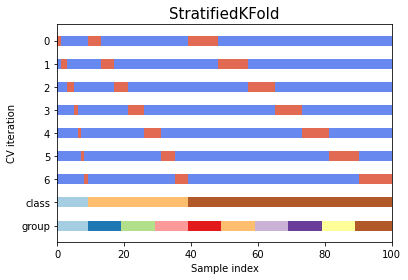

In [83]:
from sklearn.model_selection import StratifiedKFold

def plot_cv_indices(cv, X, y, group, ax, n_splits, lw=10):
    # Generate the training/testing visualizations for each CV split
    for ii, (tr, tt) in enumerate(cv.split(X=X, y=y, groups=group)):
        # Fill in indices with the training/test groups
        indices = np.array([np.nan] * len(X))
        indices[tt] = 1
        indices[tr] = 0

        # Visualize the results
        ax.scatter(range(len(indices)), [ii + .5] * len(indices),
                   c=indices, marker='_', lw=lw, cmap=cmap_cv,
                   vmin=-.2, vmax=1.2)

    # Plot the data classes and groups at the end
    ax.scatter(range(len(X)), [ii + 1.5] * len(X),
               c=y, marker='_', lw=lw, cmap=cmap_data)

    ax.scatter(range(len(X)), [ii + 2.5] * len(X),
               c=group, marker='_', lw=lw, cmap=cmap_data)

    # Formatting
    yticklabels = list(range(n_splits)) + ['class', 'group']
    ax.set(yticks=np.arange(n_splits+2) + .5, yticklabels=yticklabels,
           xlabel='Sample index', ylabel="CV iteration",
           ylim=[n_splits+2.2, -.2], xlim=[0, 100])
    ax.set_title('{}'.format(type(cv).__name__), fontsize=15)
    return ax

cmap_data = plt.cm.Paired
cmap_cv = plt.cm.coolwarm

n_points = 100

# Sample data
X = np.random.randn(100, 10)
percentiles_classes = [.1, .3, .6]
y = np.hstack([[ii] * int(100 * perc) for ii, perc in enumerate(percentiles_classes)])
# Evenly spaced groups repeated once
groups = np.hstack([[ii]*10 for ii in range(10)])

fig, ax = plt.subplots()
n_splits = 7
cv = StratifiedKFold(n_splits)
plot_cv_indices(cv, X, y, groups, ax, n_splits)

Cela nous permettra de générer des sous-ensembles des données qui contiendront les mêmes distributions de la classe Y, ou du moins la plus proche possbile. Cette façon préserve également les dépendances dans l'ordre du dataset: dans le cas où le paramètre *Shuffle* = *False*, toutes les observations dans la classe *k* dans un des test sets étaient contigües dans *y*, ou bien séparées dans *y* par des observations de classes différentes que *k*.

<br>

En utilisant cette manière de séparer notre dataset, on procède en écrivant une fonction qui va nous permettre d'afficher la courbe **ROC** pour chacun des modèles précédents et de voir ses performances.

In [84]:
from sklearn.metrics import auc, plot_roc_curve

# Run classifier with cross-validation and plot ROC curves
def ROC_with_stratified_cross_validation(classifier, nb_splits):
    
    cv = StratifiedKFold(n_splits = nb_splits)

    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)

    fig, ax = plt.subplots(figsize = (10,8))
    for i, (train, test) in enumerate(cv.split(X_crossval, y_crossval)):
        classifier.fit(X_crossval[train], y_crossval[train])
        viz = plot_roc_curve(classifier, X_crossval[test], y_crossval[test],
                             name='ROC fold {}'.format(i),
                             alpha=0.3, lw=1, ax=ax)
        interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)

    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
            label='Chance', alpha=.8)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='b',
            label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2, alpha=.8)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                    label=r'$\pm$ 1 std. dev.')

    ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
           title="Receiver operating characteristic example")
    ax.legend(loc="lower right")
    plt.show()

#### Validation croisée stratifiée pour la **Régression Logistique**:

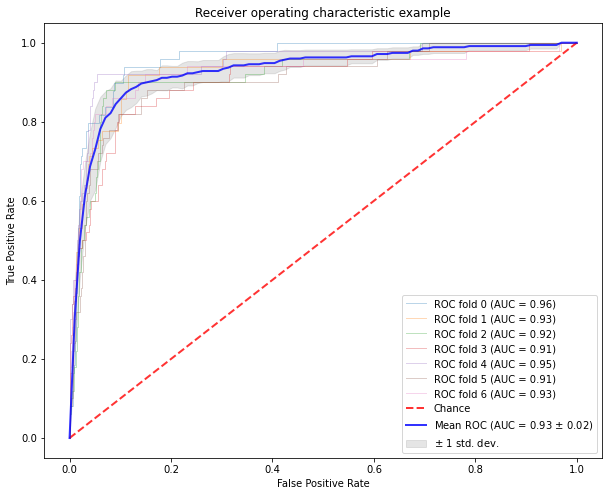

In [85]:
ROC_with_stratified_cross_validation(logr, 7)

#### Validation croisée stratifiée pour le **SVC**:

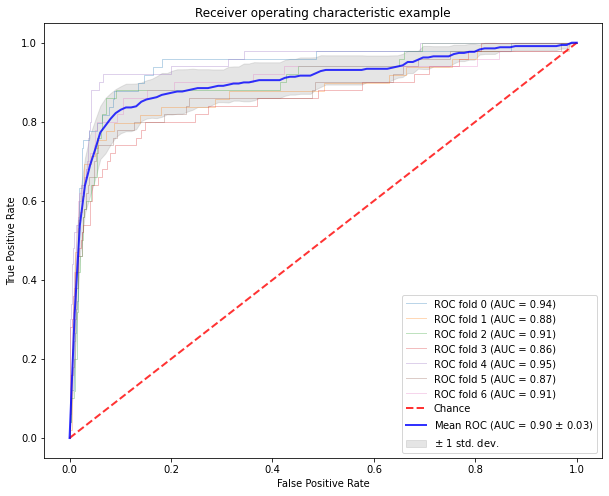

In [86]:
ROC_with_stratified_cross_validation(svc, 7)

#### Validation croisée stratifiée pour le **Random Forest**:

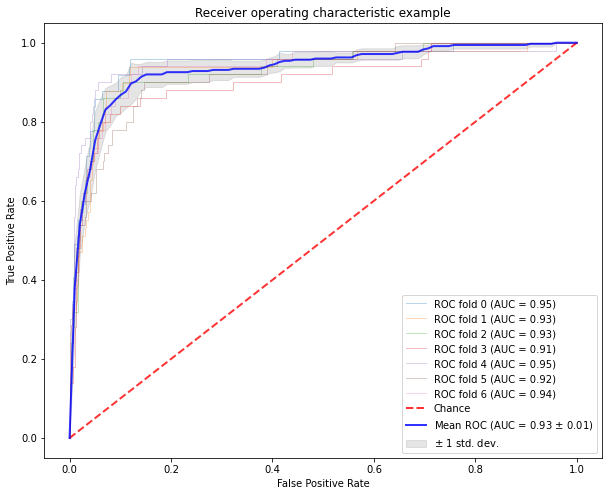

In [87]:
ROC_with_stratified_cross_validation(rf, 7)

## Conclusion

<br>

D'après la dernière analyse des modèles par validation croisée stratifiée, on peut constater que la **Régression Logistique** et le **Random Forest** montrent des résultats très satisfaisants, comme sur les nouvelles données **X_new_data**. En combinant les différentes métriques utilisées pour leur évaluation, on peut donner une classification des modèles par performance:

1. **Régression Logistique** (avec ou sans seuil modifié)
2. **Random Forest**
3. **SVC**

Mais il est importent de noter que ces modèles se comportent de façon assez similaire sur notre jeu de données et il n'y a pas de grosses différences dans leurs performances.

<br>

Il existe plusieurs modèles différents pour l'apprentissage supervisé, et peu importe celui qu'on choisit, l'important c'est de pouvoir bien intérpréter les données. Même si on n'est pas familier avec toutes les variables explicatives en détails, il faudrait toujours garder un esprit intuitif en permanance, avant de ne pas se perdre dans les nombreuses options et paramètres qui existent et de garder un esprit critique tout au long de l'anaylse, la modélisation et la validation. 